In [1]:
%load_ext autoreload
%autoreload 2
from scripts.load_data import load_raw_data
import numpy as np
import matplotlib.pyplot as plt
berea_files_lst = load_raw_data('Berea')

# list of digital rock files for "Berea"
berea_files_lst

['c:\\100_Research\\digital_rock\\dataset\\Berea_2d25um_binary.raw',
 'c:\\100_Research\\digital_rock\\dataset\\Berea_2d25um_grayscale.raw',
 'c:\\100_Research\\digital_rock\\dataset\\Berea_2d25um_grayscale_filtered.raw']

In [2]:
# load grayscale, filtered, and binary images into numpy.ndarray
from scripts.load_data import load_with_keyword_among_list
raw = load_with_keyword_among_list(berea_files_lst, 'grayscale.raw')
filtered = load_with_keyword_among_list(berea_files_lst, 'filtered.raw')
binary = load_with_keyword_among_list(berea_files_lst, 'binary.raw')

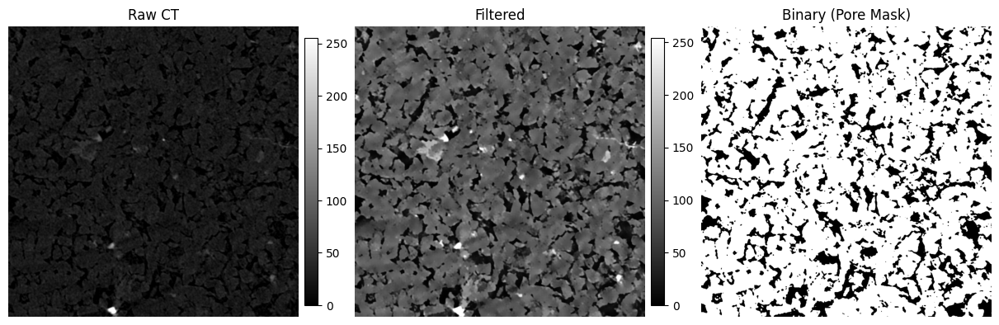

In [3]:
from scripts.visualization import show_raw_filtered_binary
fig = show_raw_filtered_binary(raw=raw, 
                               filtered=filtered, 
                               binary=binary, 
                               slice_idx=0)
plt.show()

In [4]:
from scripts.pipeline import Step, run_pipeline
from scripts.denoising import denoise_fourier, denoise_non_local_means, denoise_tv
from scripts.segmentation import segment_otsu, segment_watershed_labels
from scripts.contrast_control import contrast_stretch
from scripts.visualization import plot_pipeline_with_hists
from scripts.denoising import denoise_bias_field_correct

PIPELINE = [
    Step("fourier", denoise_fourier),
    Step("nlm", denoise_non_local_means),
    # Step("bias_correct", denoise_bias_field_correct),  
    Step("contrast_stretch", contrast_stretch),
    Step("tv", denoise_tv),
    Step("otsu", segment_otsu),                  # returns mask
    # Step("watershed", segment_watershed_labels), # takes mask -> labels
]

PARAMS = {
    "fourier": dict(
        kind="lowpass",
        cutoff_high=.99,
        transition=0.04,
        preserve_dtype=True,
    ),

    "nlm": dict(
        patch_size=3,         # bigger patches are more stable in noisy CT
        patch_distance=5,     # wider search reduces speckle
        h=None,
        fast_mode=True,
        preserve_dtype=True,
    ),
    
    "bias_correct": dict(
        sigma=15,             # adjust based on image size / resolution
    ),

    "contrast_stretch": dict(
        p_low=0.01,
        p_high=99.5,
    ),

    "tv": dict(
        weight=0.25,          # stronger edge-aware smoothing to kill boundary halos
        max_num_iter=250,
        eps=2e-4,
        preserve_dtype=True,
    ),

    "otsu": dict(
        pore_is_dark=True,
        min_size=15,         # aggressively remove tiny false pores
        opening_radius=0,     # stronger cleanup
        closing_radius=0,
    ),

    "watershed": dict(
        mask_is_pore=True,
        min_size=0,
        opening_radius=0,
        closing_radius=0,
        peak_footprint_radius=3,  # fewer markers -> less over-segmentation
        min_peak_distance=5,      # enforce separation between seeds
        compactness=0.0,
        connectivity=1,
    ),
}


In [6]:
result = run_pipeline(raw[0], PIPELINE, PARAMS)


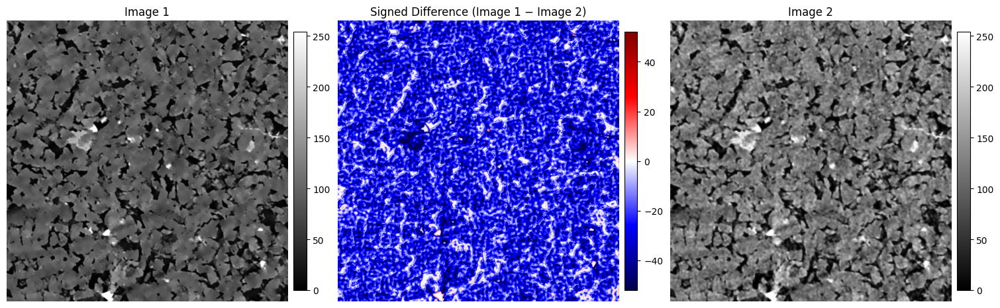

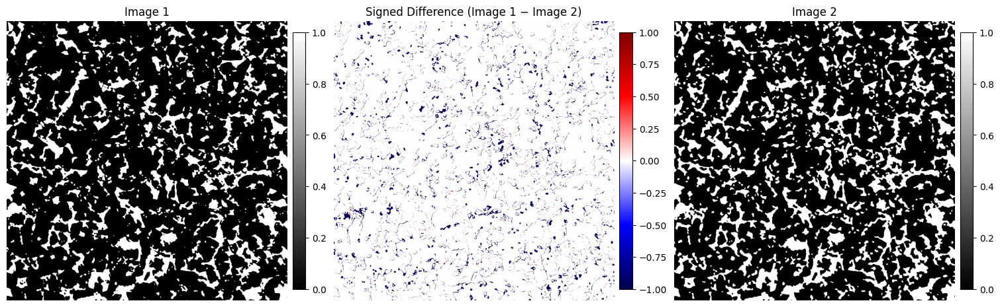

In [104]:
# difference between new and old filtered images:
from scripts.visualization import show_signed_difference_3col
show_signed_difference_3col(
    image_1=filtered[0],         # <- from the digital rock portal dataset
    image_2=result['images'][-2] # <- from our pipeline
)
show_signed_difference_3col(
    image_1=1-binary[0],         # <- from the digital rock portal dataset
    image_2=result["images"][-1] # <- from our pipeline
)

In [ ]:
from scripts.optimize_params import pso_optimize_parallel
from scripts.optimize_params import vector_to_params, misfit, build_param_spec

PARAM_RANGES = {
    "fourier": {
        "cutoff_high": dict(low=0.90, default=0.98, high=0.995),
        "transition": dict(low=0.01, default=0.04, high=0.10),
    },
    "nlm": {
        "patch_size": dict(low=3, default=3, high=7),          # int, odd preferred
        "patch_distance": dict(low=3, default=5, high=11),     # int
    },
    "bias_correct": {
        "sigma": dict(low=10, default=30, high=80),            # int/float
    },
    "contrast_stretch": {
        "p_low": dict(low=0.0, default=0.5, high=2.0),
        "p_high": dict(low=98.0, default=99.5, high=100.0),
    },
    "tv": {
        "weight": dict(low=0.05, default=0.25, high=0.6),
        "max_num_iter": dict(low=100, default=250, high=500),  # int
    },
    "otsu": {
        "min_size": dict(low=0, default=15, high=200),         # int
        "opening_radius": dict(low=0, default=1, high=5),      # int
        "closing_radius": dict(low=0, default=1, high=5),      # int
    },
    # watershed omitted here since your current PIPELINE has it commented out
}

def make_objective(img, ground_truth, pipeline, base_params, specs):
    def objective(x_vec):
        params = vector_to_params(x_vec, specs, base_params)
        result = run_pipeline(img, pipeline, params)
        est = result["final"]
        return misfit(est, ground_truth)
    return objective


In [ ]:
ground_truth_image = binary[0]  # your GT mask
img_input = raw[0]                # your raw micro-CT slice (same slice index)

specs = build_param_spec(PARAM_RANGES)
dim = len(specs)
low = np.array([sp["low"] for sp in specs], dtype=float)
high = np.array([sp["high"] for sp in specs], dtype=float)

objective = make_objective(img_input, ground_truth_image, PIPELINE, PARAMS, specs)


In [ ]:
best_x, best_f = pso_optimize_parallel(
    objective_fn=objective,
    dim=dim,
    bounds_low=low,
    bounds_high=high,
    n_particles=28,
    n_iters=50,
    seed=42,
    verbose=True
)

best_params = vector_to_params(best_x, specs, PARAMS)
print("\nBest misfit:", best_f)
print("Best params:", best_params)

[PSO] init best = 9.228480e-01
[PSO] iter 001/50 best = 9.207670e-01
[PSO] iter 005/50 best = 8.551420e-01
[PSO] iter 010/50 best = 2.124080e-01
[PSO] iter 015/50 best = 2.124080e-01


In [10]:
best_x, best_f = pso_optimize(
    objective_fn=objective,
    dim=dim,
    bounds_low=low,
    bounds_high=high,
    n_particles=28,
    n_iters=50,
    seed=42,
    verbose=True
)

best_params = vector_to_params(best_x, specs, PARAMS)
print("\nBest misfit:", best_f)
print("Best params:", best_params)

[PSO] init best = 9.228480e-01


KeyboardInterrupt: 

In [ ]:
def mistfit(estimated_image, ground_truth_image=binary[0]):
    """Calculate the misfit between estimated and ground truth images."""
    return np.mean((estimated_image - ground_truth_image) ** 2)

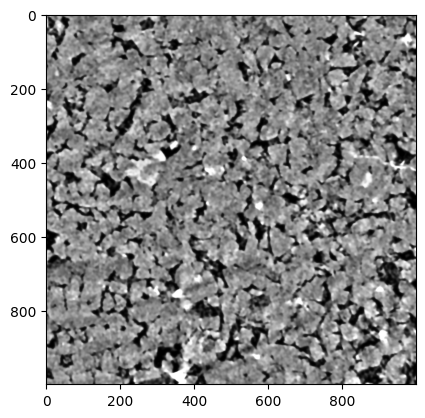

In [60]:
plt.imshow(img2_corr, 'gray')
otsu_result = segment_otsu(img2_corr, min_size = 5, opening_radius=2, closing_radius=2, pore_is_dark=True)

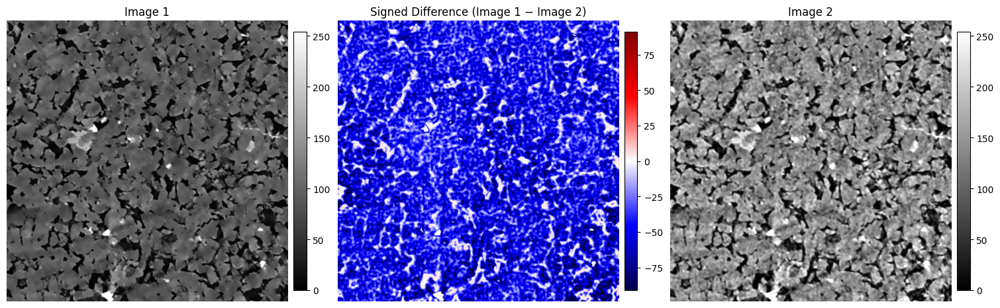

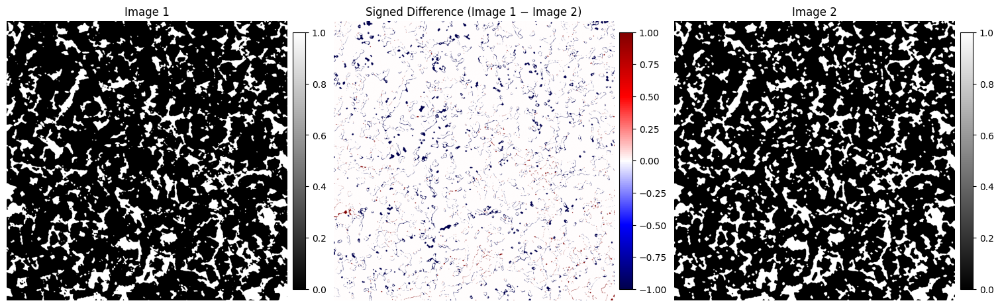

In [61]:
# difference between new and old filtered images:
from scripts.visualization import show_signed_difference_3col
show_signed_difference_3col(
    image_1=filtered[0],         # <- from the digital rock portal dataset
    image_2=img2_corr # <- from our pipeline
)
show_signed_difference_3col(
    image_1=1-binary[0],         # <- from the digital rock portal dataset
    image_2=otsu_result# result["images"][-1] # <- from our pipeline
)

In [16]:
img2 = result["images"][-2]

In [54]:
from scipy.ndimage import gaussian_filter
from scipy.signal import savgol_filter

from skimage.exposure import match_histograms

# estimate low-frequency background
background = gaussian_filter(img2, sigma=50)
# background = savgol_filter(img2, window_length=30, polyorder=7)

# bias correction
img2_corr = img2 / background * background.mean()
img2_corr = contrast_stretch(img2_corr, p_low=0.5, p_high=99.5)

# optional histogram matching
# img2_corr = match_histograms(img2_corr, img1)

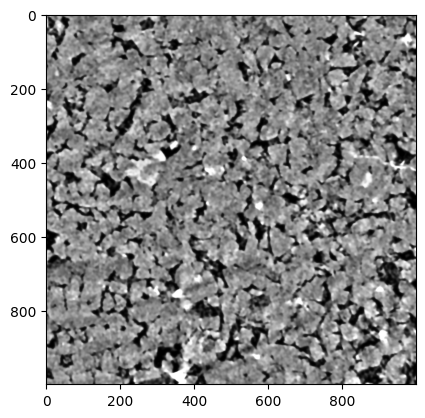

In [55]:
plt.imshow(img2_corr, 'gray')

C:\Users\DELL\AppData\Local\Temp\ipykernel_42752\1511361995.py:18: RuntimeWarning: overflow encountered in scalar negative
  im2 = axes[1, 0].imshow(diff, cmap='seismic', vmin=-vmax, vmax=vmax)


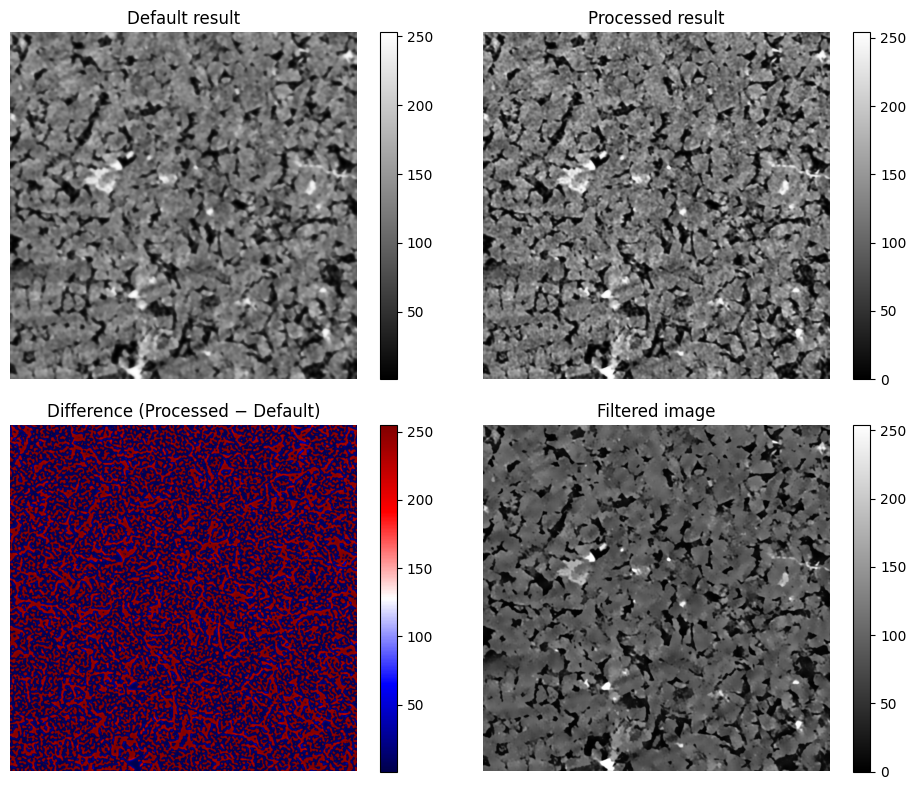

In [121]:
fig, axes = plt.subplots(2, 2, figsize=(10, 8))

# 1. Default result
im0 = axes[0, 0].imshow(result_default['images'][-2], cmap='gray')
axes[0, 0].set_title("Default result")
axes[0, 0].axis("off")
fig.colorbar(im0, ax=axes[0, 0], fraction=0.046)

# 2. Modified / filtered result
im1 = axes[0, 1].imshow(result['images'][-2], cmap='gray')
axes[0, 1].set_title("Processed result")
axes[0, 1].axis("off")
fig.colorbar(im1, ax=axes[0, 1], fraction=0.046)

# 3. Difference map
diff = result['images'][-2] - result_default['images'][-2]
vmax = abs(diff).max()
im2 = axes[1, 0].imshow(diff, cmap='seismic', vmin=-vmax, vmax=vmax)
axes[1, 0].set_title("Difference (Processed − Default)")
axes[1, 0].axis("off")
fig.colorbar(im2, ax=axes[1, 0], fraction=0.046)

# 4. Filtered image
im3 = axes[1, 1].imshow(filtered[0], cmap='gray')
axes[1, 1].set_title("Filtered image")
axes[1, 1].axis("off")
fig.colorbar(im3, ax=axes[1, 1], fraction=0.046)

plt.tight_layout()
plt.show()


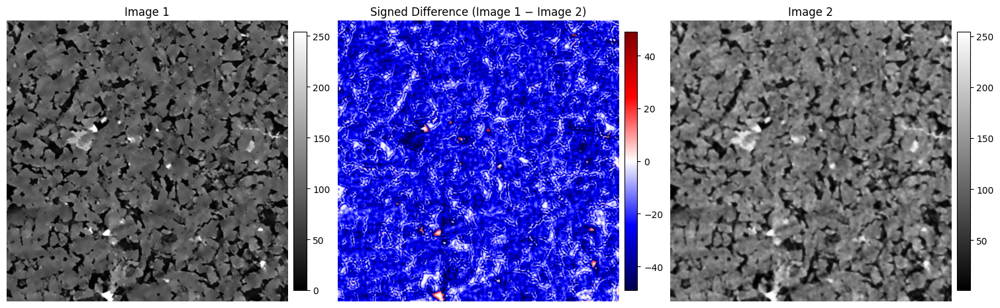

In [109]:
# difference between new and old filtered images:
from scripts.visualization import show_signed_difference_3col
show_signed_difference_3col(
    image_1=filtered[0],         # <- from the digital rock portal dataset
    image_2=result["images"][-2] # <- from our pipeline
)

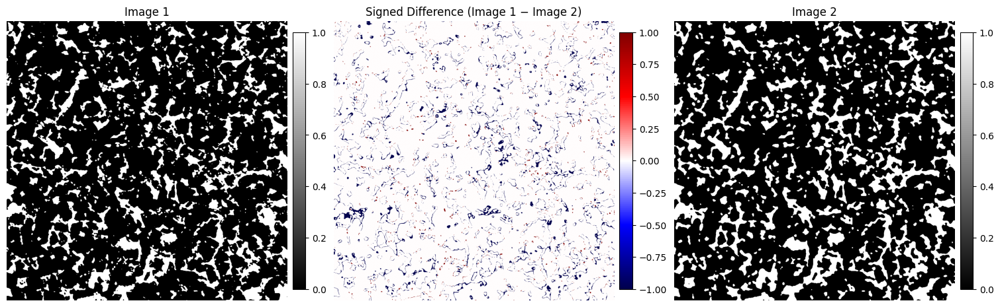

In [110]:
# difference between new and old filtered images:
from scripts.visualization import show_signed_difference_3col
show_signed_difference_3col(
    image_1=1-binary[0],         # <- from the digital rock portal dataset
    image_2=result["images"][-1] # <- from our pipeline
)

In [75]:
result_default = run_pipeline(raw_image, PIPELINE, PARAMS)
# show_signed_difference_3col(
#     image_1=filtered[0],         # <- from the digital rock portal dataset
#     image_2=result["images"][-2] # <- from our pipeline
# )

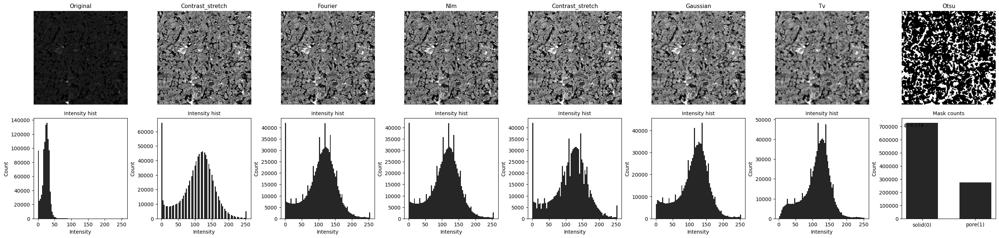

In [69]:
# Select a single 2D slice from the raw 3D CT volume - Assumes raw has shape [Z, H, W]
raw_image = raw[0]
# Run the full digital rock processing pipeline on the slice
result = run_pipeline(raw_image, PIPELINE, PARAMS)
# Visualize the pipeline results:
plot_pipeline_with_hists(raw_image, result, PIPELINE);

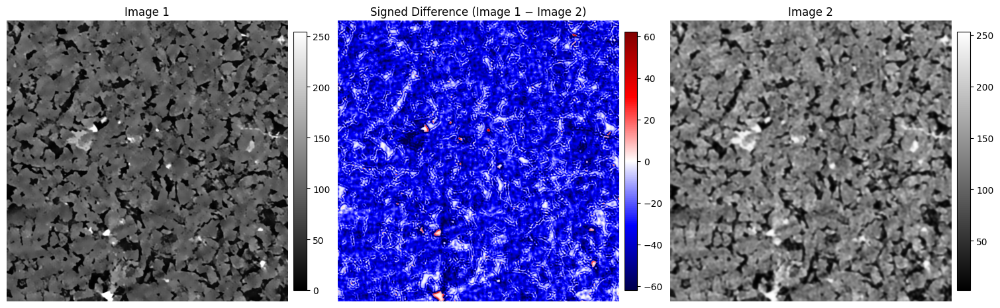

In [70]:
# difference between new and old filtered images:
from scripts.visualization import show_signed_difference_3col
show_signed_difference_3col(
    image_1=filtered[0],         # <- from the digital rock portal dataset
    image_2=result["images"][-2] # <- from our pipeline
)

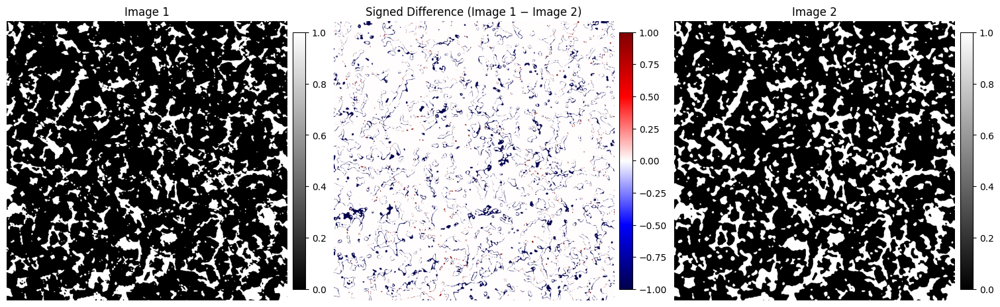

In [58]:
# difference between new and old filtered images:
from scripts.visualization import show_signed_difference_3col
show_signed_difference_3col(
    image_1=1-binary[0],         # <- from the digital rock portal dataset
    image_2=result["images"][-1] # <- from our pipeline
)

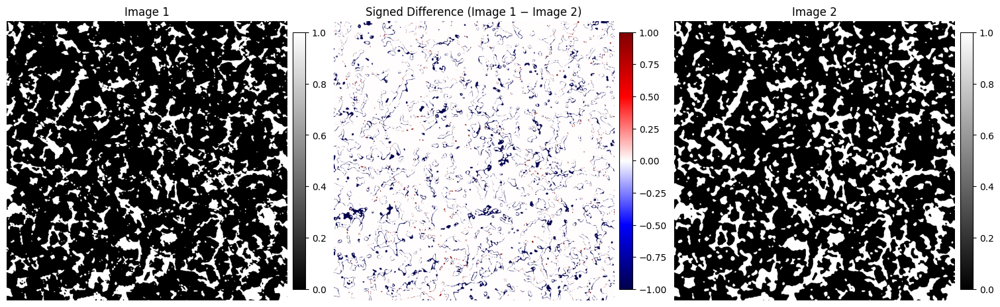

In [50]:
# difference between new and old filtered images:
from scripts.visualization import show_signed_difference_3col
show_signed_difference_3col(
    image_1=1-binary[0],         # <- from the digital rock portal dataset
    image_2=result["images"][-1] # <- from our pipeline
)

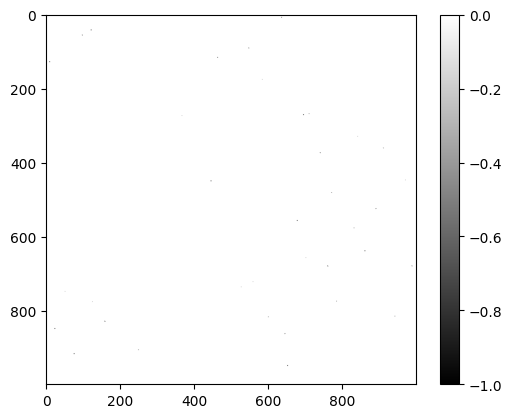

In [ ]:
outcomes = segment_otsu(filtered[:,:,:],min_size=5, opening_radius=0, closing_radius=0)
plt.imshow(outcomes[0]-1+binary[0], cmap = 'gray')
plt.colorbar()

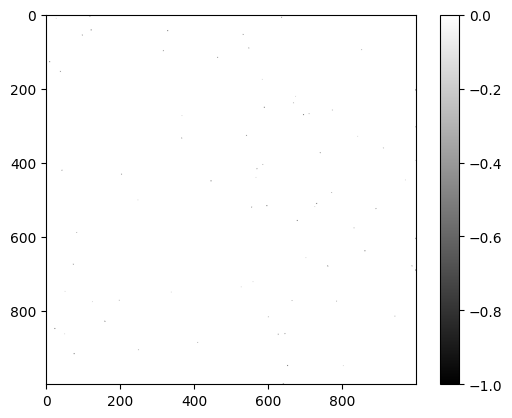

In [67]:
outcomes = segment_otsu(filtered[0],min_size=5, opening_radius=0, closing_radius=0)
plt.imshow(outcomes-1+binary[0], cmap = 'gray')
plt.colorbar()

In [ ]:

def segment_otsu(
    img: ArrayLike,
    *,
    pore_is_dark: bool = True,
    min_size: int = 0,
    opening_radius: int = 0,
    closing_radius: int = 0,
) -> np.ndarray:
    """
    Binary pore mask using Otsu threshold.

    Returns
    -------
    np.ndarray (bool)
        Pore mask (True=pore).
    """
    T = otsu_threshold(img)
    x = _as_float(img)
    pore = (x < T) if pore_is_dark else (x > T)

    pore = _cleanup_mask(
        pore,
        min_size=min_size,
        opening_radius=opening_radius,
        closing_radius=closing_radius,
    )
    return pore



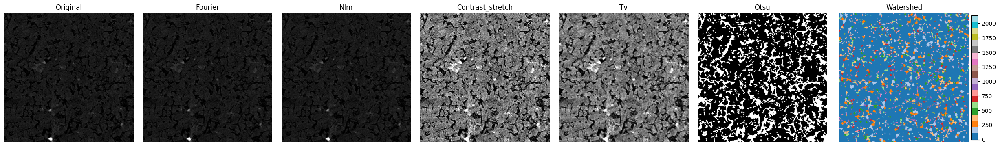

In [ ]:
# (appendix) you can also visualize using another function:
from scripts.visualization import show_pipeline_results
show_pipeline_results(raw_image, result, PIPELINE);

---

(outdated_demo)

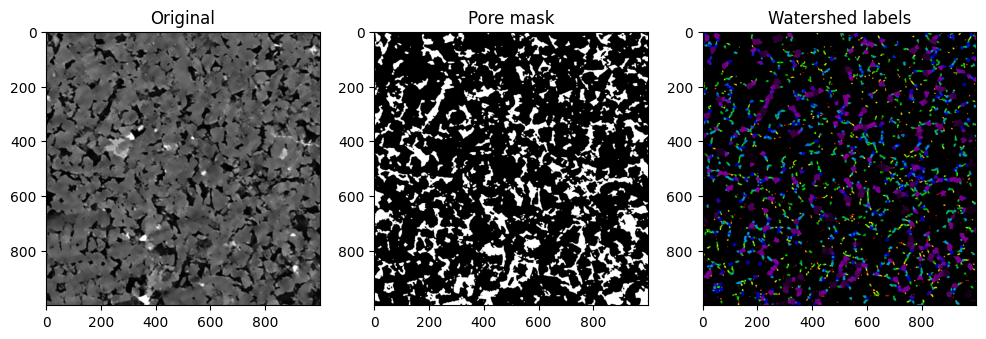

In [86]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import filters, morphology, segmentation, feature
from scipy import ndimage as ndi

# Suppose img is your normalized grayscale image
img = filtered[0,:,:]
# Step 1: threshold (Otsu)
T = filters.threshold_otsu(img)
pore = img < T

# Clean small noise
pore = morphology.remove_small_objects(pore, 5)

# Step 2: distance transform
dist = ndi.distance_transform_edt(pore)

# Step 3: find markers
coords = feature.peak_local_max(dist, footprint=np.ones((3,3)), labels=pore)
markers = np.zeros_like(dist, dtype=int)
for i, (r,c) in enumerate(coords, start=1):
    markers[r,c] = i

# Step 4: watershed
labels = segmentation.watershed(-dist, markers, mask=pore)

# Visualize
plt.figure(figsize=(12,4))
plt.subplot(1,3,1); plt.imshow(img, cmap='gray'); plt.title("Original")
plt.subplot(1,3,2); plt.imshow(pore, cmap='gray'); plt.title("Pore mask")
plt.subplot(1,3,3); plt.imshow(labels, cmap='nipy_spectral'); plt.title("Watershed labels")
plt.show()


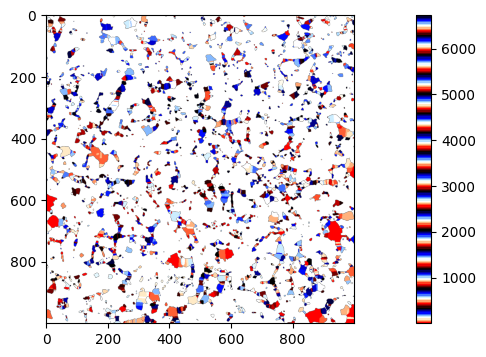

In [83]:
plt.figure(figsize=(16,4))
labels=labels.astype(float)
labels[labels==0] = np.nan  # Hide background for better visualization
plt.imshow(labels, cmap='flag')
plt.colorbar()

In [85]:
labels

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., 19., 19., 19.],
       [nan, nan, nan, ..., 19., 19., 19.],
       [nan, nan, nan, ..., 19., 19., 19.]])

(array([562., 488., 388., 525., 399., 409., 389., 332., 318., 286., 197.,
        164., 109.,  86.,  81.,  76.,  63.,  37.,  33.,  26.,  17.,   8.,
          6.,   2.,   2.]),
 array([0.77815125, 0.87069188, 0.96323251, 1.05577314, 1.14831376,
        1.24085439, 1.33339502, 1.42593565, 1.51847628, 1.6110169 ,
        1.70355753, 1.79609816, 1.88863879, 1.98117942, 2.07372005,
        2.16626067, 2.2588013 , 2.35134193, 2.44388256, 2.53642319,
        2.62896382, 2.72150444, 2.81404507, 2.9065857 , 2.99912633,
        3.09166696]),
 <BarContainer object of 25 artists>)

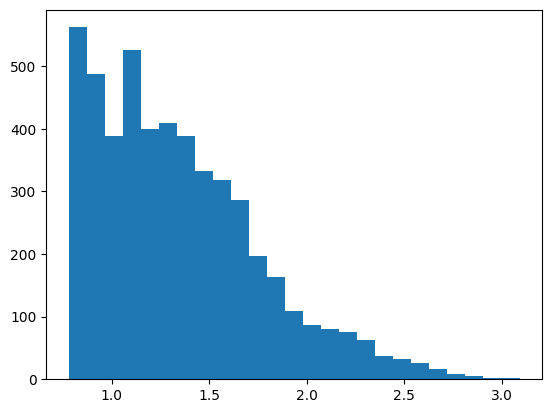

In [98]:
# psd = []
# for i in range(1, labels.max()+1):
#     psd.append(np.sum(labels == i))
psd = np.array(psd)
psd = psd[psd>4]  # Remove zero entries
plt.hist(np.log10(psd), bins=25)

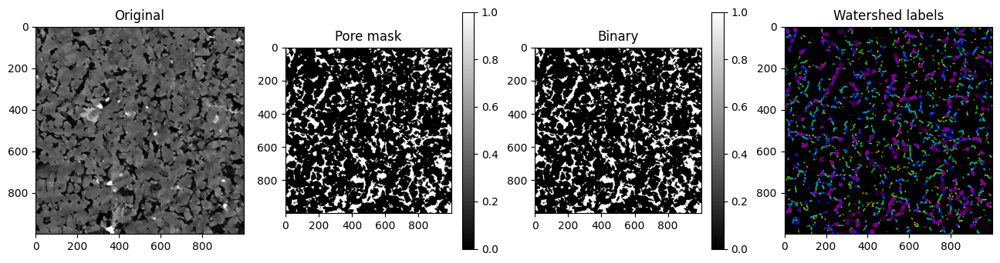

In [68]:
# Visualize
plt.figure(figsize=(16,4))
plt.subplot(1,4,1); plt.imshow(img, cmap='gray'); plt.title("Original")
plt.subplot(1,4,2); plt.imshow(pore, cmap='gray'); plt.title("Pore mask")
plt.colorbar()
plt.subplot(1,4,3); plt.imshow(1- binary[0,:,:], cmap='gray'); plt.title("Binary")
plt.colorbar()
plt.subplot(1,4,4); plt.imshow(labels, cmap='nipy_spectral'); plt.title("Watershed labels")
plt.show()
